In [1]:
!pip install numba

You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.


In [2]:
import ast
import copy
import glob
import json
import os
import re
import shutil

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from IPython.core.interactiveshell import InteractiveShell
from PIL import Image
from sklearn.model_selection import GroupKFold, KFold, StratifiedKFold
from tqdm import tqdm

InteractiveShell.ast_node_interactivity = "all"
import copy

import seaborn as sns
import torch
import torchvision
from IPython.display import clear_output
from torchvision.ops import box_iou

from src.utils.custom_y5_utils import ensemble_predict, get_ensemble, plot_bboxes

In [3]:
def show_img(img, bbox, pred=None):
    img_h, img_w = img.shape[:2]

    fig, ax = plt.subplots(1, 1, figsize=(15, 8))
    ax.imshow(img)
    for i in range(len(bbox)):
        x_c, y_c, w, h = bbox[i]
        rect = plt.Rectangle(
            [(x_c - w / 2) * img_w, (y_c - h / 2) * img_h],
            w * img_w,
            h * img_h,
            ec="b",
            fc="none",
            lw=2.0,
        )
        ax.add_patch(rect)
    if pred is not None:
        for i in range(len(pred)):
            x_c, y_c, w, h = pred[i]
            rect = plt.Rectangle(
                [x_c - w / 2, y_c - h / 2],
                w,
                h,
                ec="r",
                fc="none",
                lw=2.0,
            )
            ax.add_patch(rect)
    plt.show();

In [4]:
TRAIN_DF_PART = "/app/_data/tensorflow-great-barrier-reef/train.csv"

In [5]:
df = pd.read_csv(TRAIN_DF_PART)
df["img_path"] = (
    "/app/_data/tensorflow-great-barrier-reef/train_images/video_"
    + df.video_id.astype("str")
    + "/"
    + df.video_frame.astype("str")
    + ".jpg"
)
df["annotations"] = df["annotations"].apply(lambda x: ast.literal_eval(x))
df["len_annotation"] = df["annotations"].str.len()
df["image_id"] = df["image_id"].str.replace("-", "_", regex=True)
df["new_img_path"] = f"/app/_data/images/" + df["image_id"] + ".jpg"
df["label"] = df["len_annotation"].apply(lambda x: 0 if x == 0 else 1)

In [7]:
MODELS = [
    ["/app/_data/YOLOv5Weights3/yolov5l6_val2_best.pt", 2880 * 2, 0.1],
    ["/app/_data/YOLOv5Weights/best5m63840_val1.pt", 3840, 0.1],
    ["/app/_data/yolo5_seq_weights_0/yolov5m6_seq_3008_0_f2_best.pt", 3008, 0.1],
    ["/app/_data/YOLOv5Weights3/yolov5s6_val29_best.pt", 4480, 0.1],
    ["/app/_data/YOLOv5Weights3/yolov5m6_val3_3840_best.pt", 3840, 0.1],
    ["/app/_data/YOLOv5full_train_weights/epoch6.pt", 3008 * 2, 0.1],
]
mod_weights = [2, 1, 1, 1, 1, 2]
models, MODEL_PATHS, IMG_SIZES, CONF_THRESHS = get_ensemble(MODELS, 0.45)

YOLOv5 🚀 v6.0-193-gdb1f83b torch 1.9.1+cu111 CUDA:0 (NVIDIA GeForce RTX 3090, 24265MiB)

Fusing layers... 
Model Summary: 476 layers, 76118664 parameters, 0 gradients, 110.0 GFLOPs
Adding AutoShape... 
YOLOv5 🚀 v6.0-193-gdb1f83b torch 1.9.1+cu111 CUDA:0 (NVIDIA GeForce RTX 3090, 24265MiB)

Fusing layers... 
Model Summary: 378 layers, 35248920 parameters, 0 gradients, 49.0 GFLOPs
Adding AutoShape... 
YOLOv5 🚀 v6.0-193-gdb1f83b torch 1.9.1+cu111 CUDA:0 (NVIDIA GeForce RTX 3090, 24265MiB)

Fusing layers... 
Model Summary: 378 layers, 35248920 parameters, 0 gradients, 49.0 GFLOPs
Adding AutoShape... 
YOLOv5 🚀 v6.0-193-gdb1f83b torch 1.9.1+cu111 CUDA:0 (NVIDIA GeForce RTX 3090, 24265MiB)

Fusing layers... 
Model Summary: 280 layers, 12308200 parameters, 0 gradients, 16.2 GFLOPs
Adding AutoShape... 
YOLOv5 🚀 v6.0-193-gdb1f83b torch 1.9.1+cu111 CUDA:0 (NVIDIA GeForce RTX 3090, 24265MiB)

Fusing layers... 
Model Summary: 378 layers, 35248920 parameters, 0 gradients, 49.0 GFLOPs
Adding AutoShap

In [16]:
final_thres = 0.2
wbf_skip_box_thr = 0.1
wbf_iou_thres = 0.4
conf_type = "avg"
AUGMENT = False
WBF = False
mod_weights = [2, 1, 1, 1, 1, 2]
for ix in tqdm(df.index.tolist()):
    img_path = df.loc[ix, "img_path"]
    img = np.array(Image.open(img_path))
    final_bboxes, _ = ensemble_predict(
        models=models,
        img_sizes=IMG_SIZES,
        img=img,
        augment=AUGMENT,
        skip_box_thr=0.1,
        iou_thres=0.45,
        final_thres=0.2,
        conf_type=conf_type,
        mod_weights=None,
        WBF=True,
    )
    df.loc[ix, "prediction"] = " ".join(final_bboxes)

100% 23501/23501 [7:57:06<00:00,  1.22s/it]  


In [17]:
df.to_csv("/app/_data/df_pred.csv", index=False)

In [18]:
df = pd.read_csv("/app/_data/df_pred.csv")

In [19]:
df['score'] = df['prediction'].str.split().str[0].astype('float')

In [20]:
df.query('len_annotation==0 and score >= 0.7').sample(5)

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,img_path,len_annotation,new_img_path,label,prediction,score
5309,0,53708,9486,601,0_9486,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/0_9486.jpg,0,0.7210536599159241 64 0 46 27,0.721054
19570,2,22643,5668,305,2_5668,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/2_5668.jpg,0,0.7056983709335327 325 5 27 23,0.705698
8091,1,15827,1983,65,1_1983,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/1_1983.jpg,0,0.7030249834060669 351 590 36 39,0.703025
16997,2,37114,2057,2057,2_2057,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/2_2057.jpg,0,0.7278037667274475 1193 285 84 84,0.727804
21164,2,29859,8423,651,2_8423,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/2_8423.jpg,0,0.752148449420929 467 640 56 43,0.752148


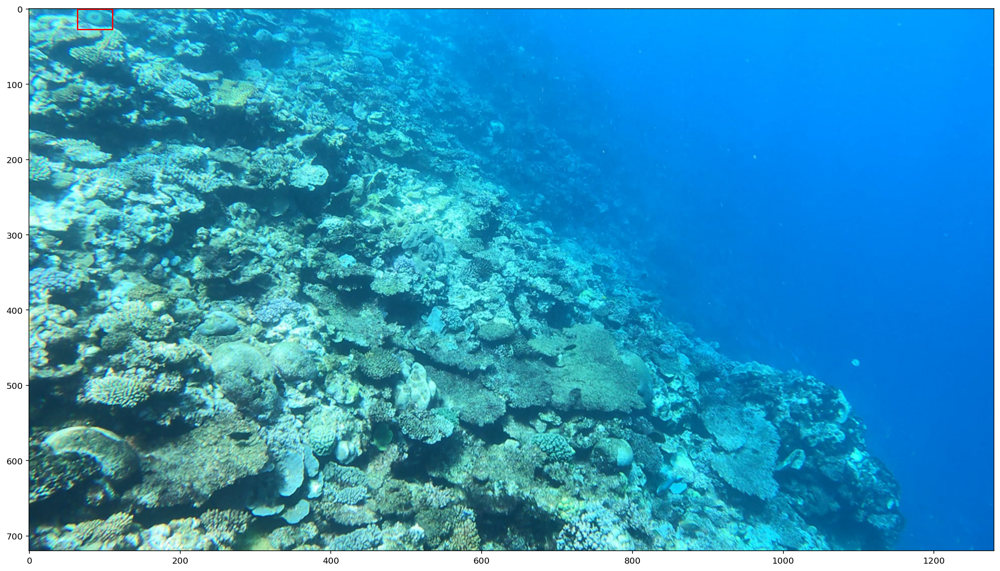

In [21]:
ix = 5309
path = df.loc[ix, "img_path"]
img = np.array(Image.open(path))
pred = df.loc[ix, "prediction"]
pred = [
    " ".join(pred.split()[i * 5 : i * 5 + 5]) for i in range(len(pred.split()) // 5)
]
plot_bboxes(img_path=path, img=img, df=None, bboxes=pred)

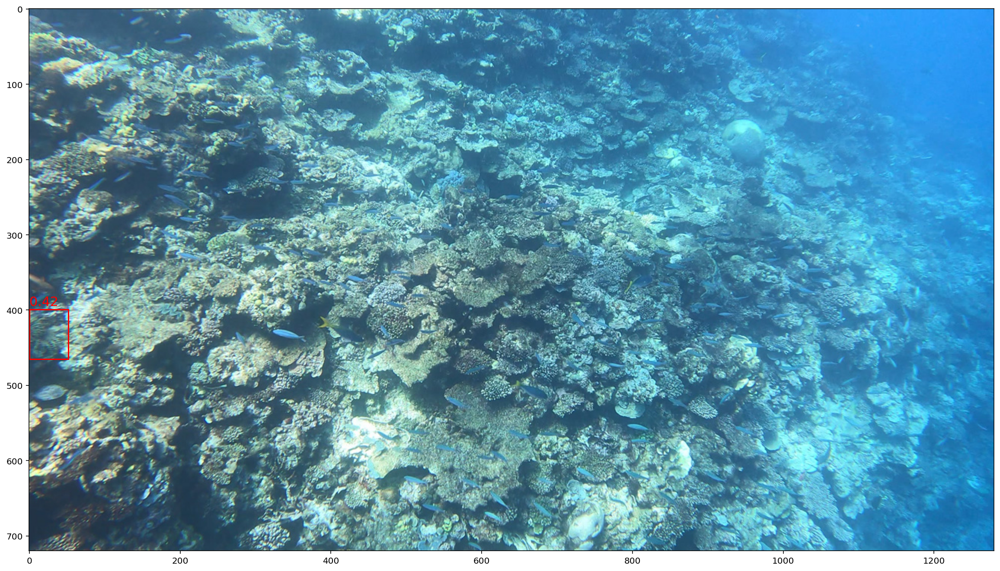

In [22]:
ix = 3485
path = df.loc[ix, "img_path"]
img = np.array(Image.open(path))
pred = df.loc[ix, "prediction"]
pred = [
    " ".join(pred.split()[i * 5 : i * 5 + 5]) for i in range(len(pred.split()) // 5)
]
plot_bboxes(img_path=path, img=img, df=None, bboxes=pred)

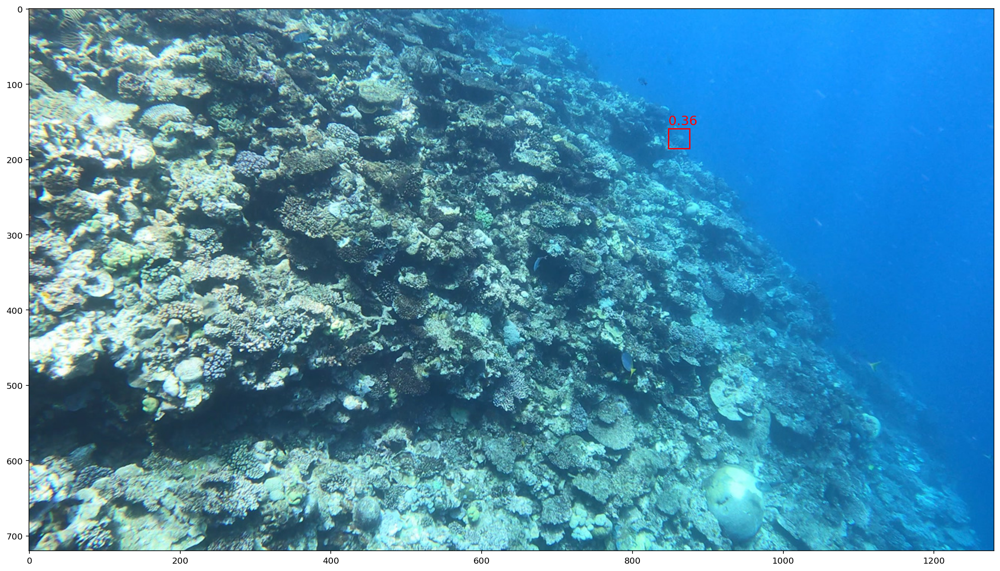

In [23]:
ix = 3552
path = df.loc[ix, "img_path"]
img = np.array(Image.open(path))
pred = df.loc[ix, "prediction"]
pred = [
    " ".join(pred.split()[i * 5 : i * 5 + 5]) for i in range(len(pred.split()) // 5)
]
plot_bboxes(img_path=path, img=img, df=None, bboxes=pred)